In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import dynamo as dyn

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

/opt/anaconda3/envs/graphvelo/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from gam import fit_gene_trend

In [3]:
adata = sc.read('gv_result_k50.h5ad')
adata

AnnData object with n_obs × n_vars = 6431 × 962
    obs: 'celltype', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'pseudotime', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'mean', 'std', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'avg_prog_confidence', 'avg_mature_confidence'
    uns: 'T_fwd_params', 'WNN', 'celltype_colors', 'gene_wise_confidence', 'neigh

In [4]:
adata.obsm['velocity_umap'] = adata.obsm['gv_umap'].copy()
dyn.vf.VectorField(adata, basis='umap', M=2000, velocity_based_sampling=False, pot_curl_div=True)

|-----> VectorField reconstruction begins...
|-----> Retrieve X and V based on basis: UMAP. 
        Vector field will be learned in the UMAP space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----> [SparseVFC] completed [25.4710s]
|-----> Running ddhodge to estimate vector field based pseudotime in umap basis...
|-----> graphizing vectorfield...
|-----------> calculating neighbor indices...
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected
|-----------> not all cells are used, set diag to 1...
|-----------> Constructing W matrix according upsampling=True and downsampling=True options...
|-----> [ddhodge completed] completed [37.2653s]
|-----> Computing curl...


Calculating 2-D curl: 100%|██████████| 6431/6431 [00:00<00:00, 18568.77it/s]

|-----> Computing divergence...



Calculating divergence: 100%|██████████| 7/7 [00:00<00:00, 28.54it/s]


|-----> [VectorField] completed [63.5342s]


In [5]:
adata.layers['velocity_gv'] /= adata.layers['velocity_gv'].max(0, keepdims=True)
adata.layers['velocity_c'] /= adata.layers['velocity_c'].max(0, keepdims=True)

In [6]:
gdata1 = fit_gene_trend(adata, tkey='umap_ddhodge_potential', layer='velocity_gv', genes=adata.var_names, grid_num=100)
gdata2 = fit_gene_trend(adata, tkey='umap_ddhodge_potential', layer='velocity_c', genes=adata.var_names, grid_num=100)

Fitting trends using GAM: 100%|██████████| 962/962 [00:14<00:00, 64.91it/s]


In [7]:
gdata2.obs_names = [i+'-chrom' for i in gdata2.obs_names]

In [8]:
gdata = sc.concat([gdata1, gdata2])
gdata

AnnData object with n_obs × n_vars = 1924 × 100

In [9]:
gs = [i for i in adata.var_names if i[-5:]!='chrom']

## DTW

In [10]:
from dtaidistance import dtw

In [11]:
dtw_dist = np.zeros(gdata.n_obs//2)
for i in range(gdata.n_obs//2):
    j = i + gdata.n_obs//2
    d= dtw.distance(gdata[i].X.flatten(), gdata[j].X.flatten())
    dtw_dist[i] = d

In [12]:
def find_elbow_point(sequence):
    sequence = np.array(sequence)
    n_points = len(sequence)
    x = np.arange(n_points)
    
    first_point = np.array([x[0], sequence[0]])
    last_point = np.array([x[-1], sequence[-1]])
    line_vec = last_point - first_point
    line_vec_norm = line_vec / np.linalg.norm(line_vec)

    distances = np.zeros(n_points)
    for i in range(n_points):
        point = np.array([x[i], sequence[i]])
        vec_from_first = point - first_point
        proj_onto_line = np.dot(vec_from_first, line_vec_norm) * line_vec_norm
        vec_to_line = vec_from_first - proj_onto_line
        distances[i] = np.linalg.norm(vec_to_line)
    
    elbow_point_index = np.argmax(distances)
    
    return elbow_point_index

In [21]:
with open('../../../data/CCD_genes.txt', 'r') as file:
    # Read each line in the file and strip newlines or extra spaces
    ccdg = [line.strip() for line in file.readlines()]
ccdg = [gene.capitalize() for gene in ccdg]

In [14]:
sorted_ind = np.argsort(dtw_dist)
ind = find_elbow_point(dtw_dist[sorted_ind])

In [26]:
decouple_genes = gdata.obs_names[sorted_ind[ind:]].tolist()
common_genes = [i for i in gdata1.obs_names if i in ccdg]
len(common_genes)

35

In [27]:
ccd_ind = [gdata.obs_names[sorted_ind].to_list().index(gene) for gene in common_genes]
common_ind = [gdata.obs_names[sorted_ind].to_list().index(gene) for gene in common_genes]
common_ind_ = [gdata.obs_names[sorted_ind].to_list().index(gene) for gene in ['Cenpe', 'Kif11', 'Cenpf']]

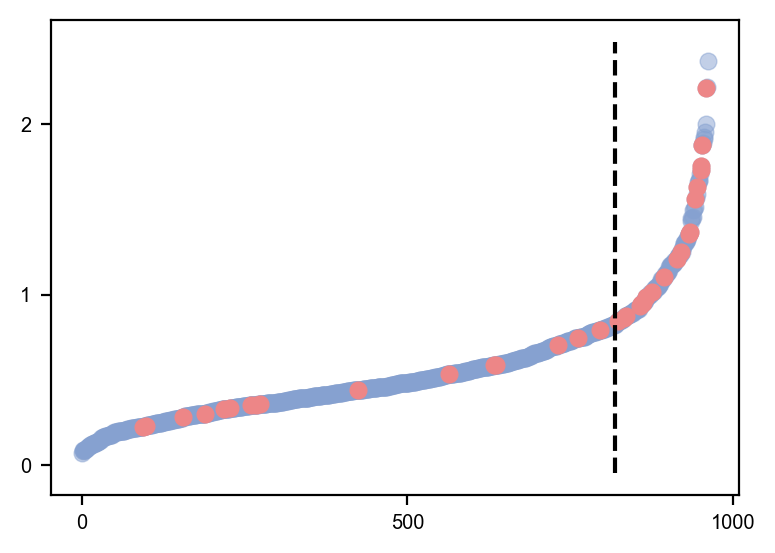

In [39]:
x_val = np.arange(len(dtw_dist))
y_val = dtw_dist[sorted_ind]
fig, ax = plt.subplots(1,1, figsize=(4,2.8))
plt.scatter(x_val, y_val, alpha=0.5, c='#86a1d0')
plt.vlines(np.arange(len(dtw_dist))[ind], plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.scatter(x_val[common_ind], y_val[common_ind], c='#ed8687', alpha=1)
# for idx in common_ind:
#     plt.annotate(gdata.obs_names[sorted_ind][idx], 
#                  (x_val[idx], y_val[idx]), 
#                  xycoords='data',
#                  xytext=(-30,10), 
#                  textcoords="offset points", 
#                  ha='center', 
#                  fontsize=12,
#                  arrowprops=dict(arrowstyle="->"))
plt.tight_layout()
plt.yticks([0,1,2])
plt.xticks([0,500,1000])
plt.savefig("figures/decouple_rank_genes.pdf", dpi=300, transparent=True)
plt.show()

In [32]:
import gseapy as gp

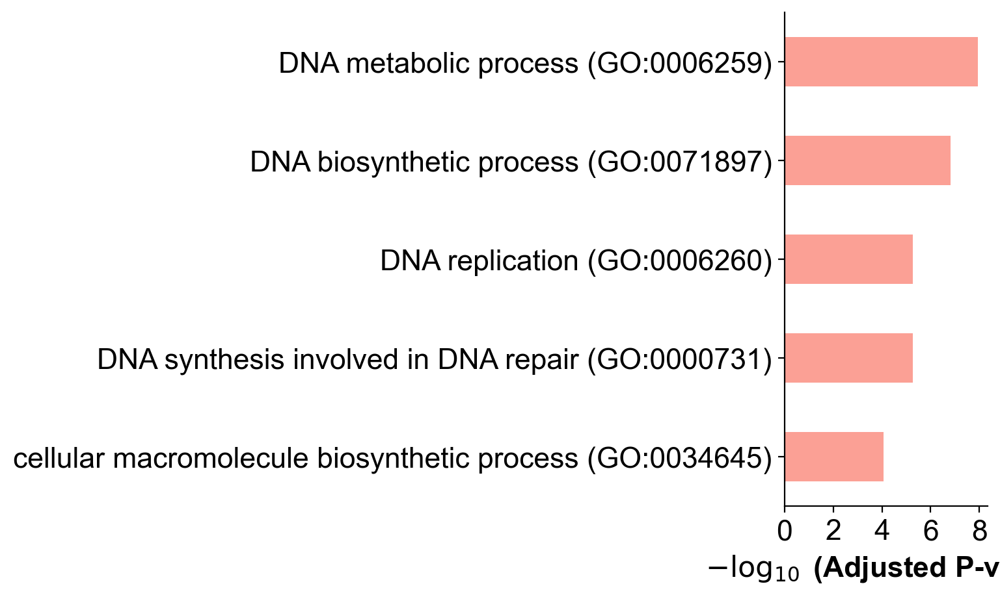

In [40]:
enr = gp.enrichr(gdata.obs_names[np.argsort(dtw_dist)[ind:]].tolist(), gene_sets='GO_Biological_Process_2018', organism='mouse')
gp.barplot(enr.res2d, figsize=(2,5), top_term=5)
# plt.savefig("figures_sup/decouple_gene_gsea.pdf", transparent=True, dpi=300)
plt.show()

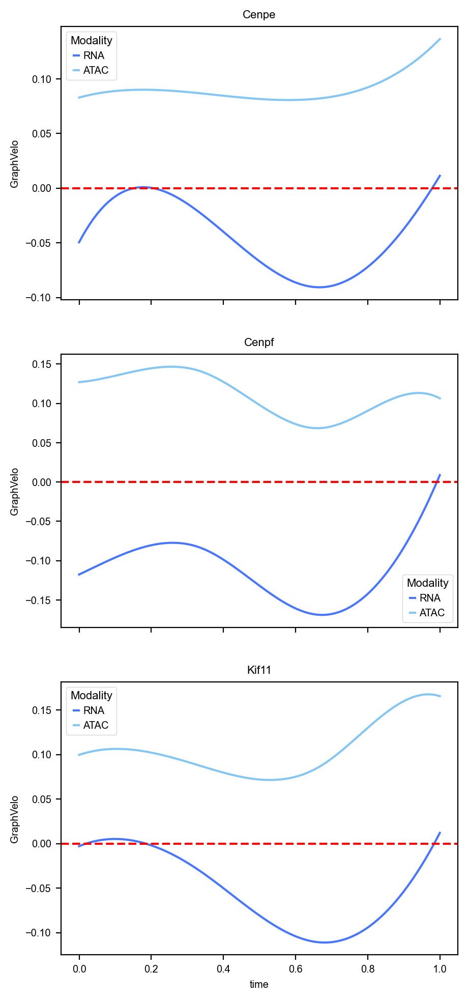

In [31]:
t = np.linspace(0, 1, gdata.n_vars)
fig, axs = plt.subplots(3, 1, figsize=(5, 12), sharex=True)
axs = axs.flatten()
for i, data in enumerate(['Cenpe', 'Cenpf', 'Kif11']):
    df = pd.DataFrame(
        {'time': t.tolist()+t.tolist(),
         'GraphVelo': gdata[data].X.flatten().tolist()+gdata[data+'-chrom'].X.flatten().tolist(),
         'Modality': ['RNA']*len(t)+['ATAC']*len(t)
         }
    )
    axs[i] = sns.lineplot(data=df, x='time', y='GraphVelo', hue='Modality', ax=axs[i])
    axs[i].axhline(y=0, color='red', linestyle='--')
    axs[i].set_title(data)
plt.savefig("figures_sup/decouple_velo_trend.pdf", transparent=True, dpi=300)
plt.show()

|-----------> plotting with basis key=X_umap


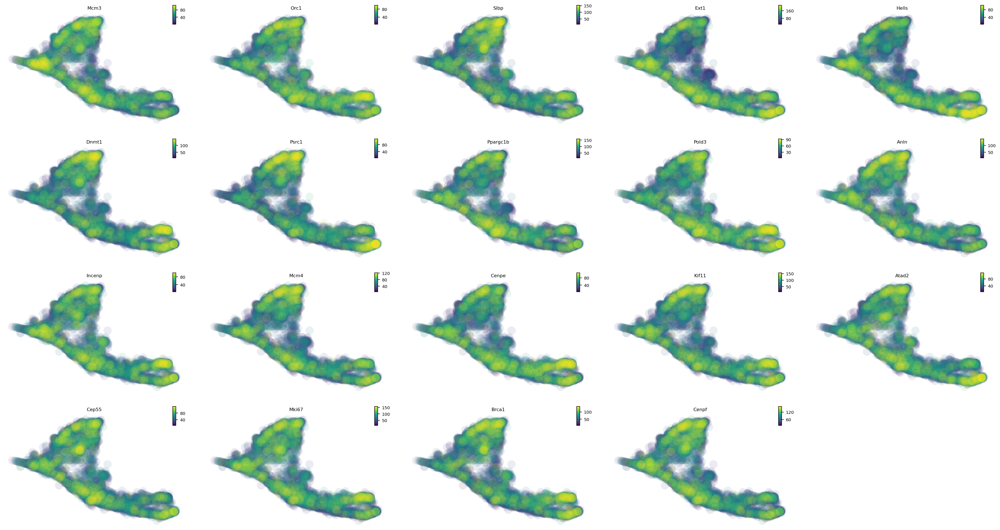

|-----------> plotting with basis key=X_umap


<Figure size 600x400 with 0 Axes>

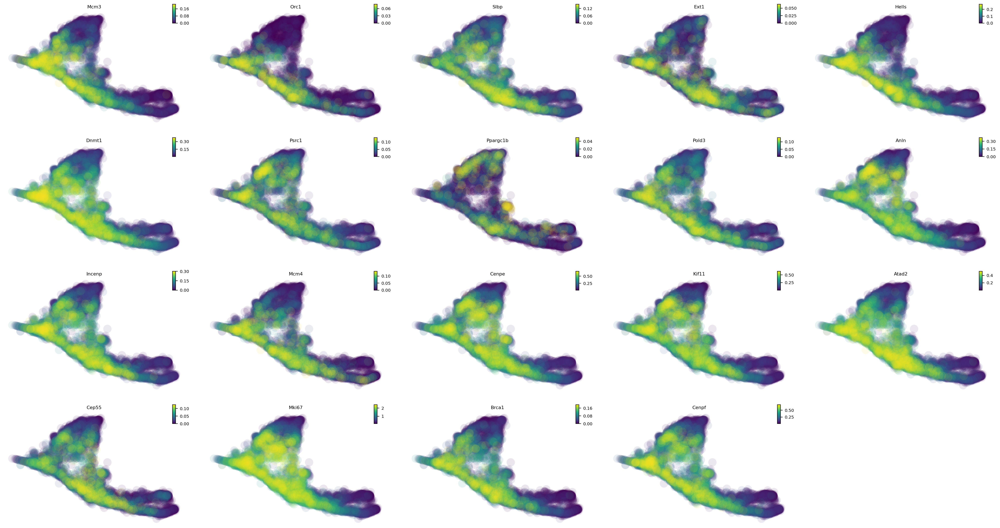

In [18]:
ax = dyn.pl.scatters(adata, color=common_genes, basis='umap', layer='Mc', use_smoothed=False, ncols=5, save_show_or_return='return')
plt.savefig('figures_sup/decouple_gene_Mc.pdf', transparent=True, dpi=300)
plt.show()
plt.clf()
ax = dyn.pl.scatters(adata, color=common_genes, basis='umap', layer='Ms', use_smoothed=False, ncols=5, save_show_or_return='return')
plt.savefig('figures_sup/decouple_gene_Ms.pdf', transparent=True, dpi=300)
plt.show()

## Finished